## 1. Import Libraries

In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

import plotly.express as px
import plotly.graph_objects as go

from pathlib import Path

sns.set_style("whitegrid")

plt.rcParams["figure.figsize"]=(12,6)

## 2. Load Datasets

In [2]:
DATA_PATH = Path("../data/processed")

fund_master = pd.read_csv(DATA_PATH/"01_fund_master_cleaned.csv")
nav = pd.read_csv(DATA_PATH/"02_nav_history_cleaned.csv")
aum = pd.read_csv(DATA_PATH/"03_aum_by_fund_house_cleaned.csv")
sip = pd.read_csv(DATA_PATH/"04_monthly_sip_inflows_cleaned.csv")
category = pd.read_csv(DATA_PATH/"05_category_inflows_cleaned.csv")
folio = pd.read_csv(DATA_PATH/"06_industry_folio_count_cleaned.csv")
performance = pd.read_csv(DATA_PATH/"07_scheme_performance_cleaned.csv")
investor = pd.read_csv(DATA_PATH/"08_investor_transactions_cleaned.csv")
portfolio = pd.read_csv(DATA_PATH/"09_portfolio_holdings_cleaned.csv")
benchmark = pd.read_csv(DATA_PATH/"10_benchmark_indices_cleaned.csv")

## 3. Dataset Overview

In [3]:
datasets={
"Fund Master":fund_master,
"NAV":nav,
"AUM":aum,
"SIP":sip,
"Category":category,
"Folio":folio,
"Performance":performance,
"Investor":investor,
"Portfolio":portfolio,
"Benchmark":benchmark
}

for name,df in datasets.items():
    print(f"{name}: {df.shape}")

Fund Master: (40, 15)
NAV: (46000, 3)
AUM: (90, 5)
SIP: (48, 6)
Category: (144, 3)
Folio: (21, 6)
Performance: (40, 19)
Investor: (32778, 13)
Portfolio: (322, 8)
Benchmark: (8050, 3)


## 4. Exploratory Data Analysis

### Task-1 : NAV Trend Analysis (2022–2026)

In [4]:
# ==========================================================
# TASK 1 : NAV Trend Analysis (2022–2026)
# ==========================================================

# Convert date column to datetime
nav["date"] = pd.to_datetime(nav["date"])

# Merge NAV history with fund names
nav_df = nav.merge(
    fund_master[["amfi_code", "scheme_name"]],
    on="amfi_code",
    how="left"
)

# Sort by date
nav_df = nav_df.sort_values("date")

# Created interactive line chart
fig = px.line(
    nav_df,
    x="date",
    y="nav",
    color="scheme_name",
    title="Daily NAV Trend (2022–2026)",
    labels={
        "date": "Date",
        "nav": "NAV",
        "scheme_name": "Scheme Name"
    }
)

# Highlight 2023 Bull Run
fig.add_vrect(
    x0="2023-01-01",
    x1="2023-12-31",
    fillcolor="green",
    opacity=0.12,
    line_width=0,
    annotation_text="2023 Bull Run",
    annotation_position="top left"
)

# Highlight 2024 Market Correction
fig.add_vrect(
    x0="2024-01-01",
    x1="2024-12-31",
    fillcolor="red",
    opacity=0.10,
    line_width=0,
    annotation_text="2024 Market Correction",
    annotation_position="top left"
)

# chart appearance
fig.update_traces(
    line=dict(width=1.5)
)

fig.update_layout(
    template="plotly_white",
    height=700,
    width=1400,
    hovermode="closest",
    legend_title="Scheme Name",
    font=dict(size=14),
    title_x=0.5
)

# Save chart
#fig.write_image("../reports/charts/nav_trend.png",width=1200,height=700,scale=1)
fig.write_html("../reports/charts/nav_trend.html")

# Display chart
fig.show()

### Insight 1: NAV Trend Analysis

##### - Daily NAV trends were analyzed for all 40 mutual fund schemes from 2022 to 2026.
##### - Most equity-oriented schemes showed strong growth during the 2023 bull market.
##### - Temporary corrections were observed across several schemes during 2024 before resuming upward movement.
##### - The interactive Plotly chart enables comparison of NAV movement across all schemes over time.

###  Task-2 : AUM Growth Analysis

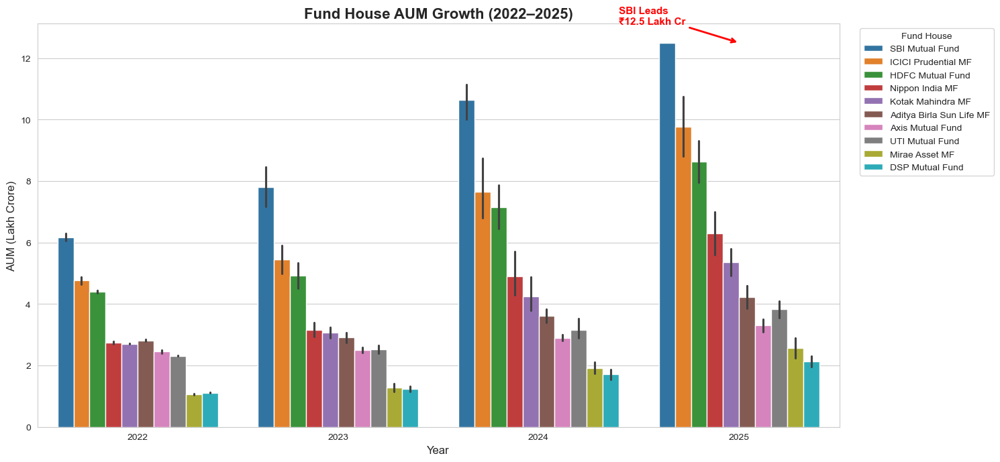

In [5]:
# ==========================================================
# TASK 2 : AUM Growth Analysis (2022–2025)
# ==========================================================

# Convert date column to datetime
aum["date"] = pd.to_datetime(aum["date"])

# Extract year
aum["year"] = aum["date"].dt.year

# Create figure
plt.figure(figsize=(15, 7))

ax = sns.barplot(
    data=aum,
    x="year",
    y="aum_lakh_crore",
    hue="fund_house"
)

# Titles
plt.title("Fund House AUM Growth (2022–2025)", fontsize=16, weight="bold")
plt.xlabel("Year", fontsize=12)
plt.ylabel("AUM (Lakh Crore)", fontsize=12)

plt.xticks(rotation=0)

# Legend
plt.legend(
    title="Fund House",
    bbox_to_anchor=(1.02, 1),
    loc="upper left"
)

# Highlight SBI dominance
plt.annotate(
    "SBI Leads\n₹12.5 Lakh Cr",
    xy=(3, 12.5),
    xytext=(2.4, 13.1),
    fontsize=11,
    color="red",
    fontweight="bold",
    arrowprops=dict(
        arrowstyle="->",
        color="red",
        lw=2
    )
)


plt.tight_layout()

# Save chart
plt.savefig("../reports/charts/aum_growth.png", dpi=300)

plt.show()

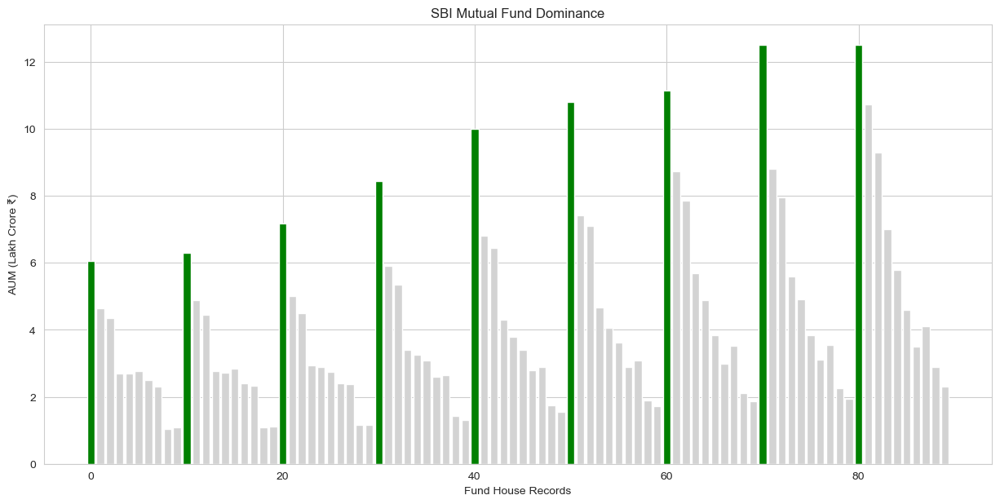

In [6]:
plt.figure(figsize=(15,7))

colors = []

for fund in aum["fund_house"]:
    if fund == "SBI Mutual Fund":
        colors.append("green")
    else:
        colors.append("lightgray")

plt.bar(
    range(len(aum)),
    aum["aum_lakh_crore"],
    color=colors
)

plt.title("SBI Mutual Fund Dominance")

plt.ylabel("AUM (Lakh Crore ₹)")

plt.xlabel("Fund House Records")

plt.savefig("../reports/charts/sbi-dominance_by_aum.png")
plt.show()

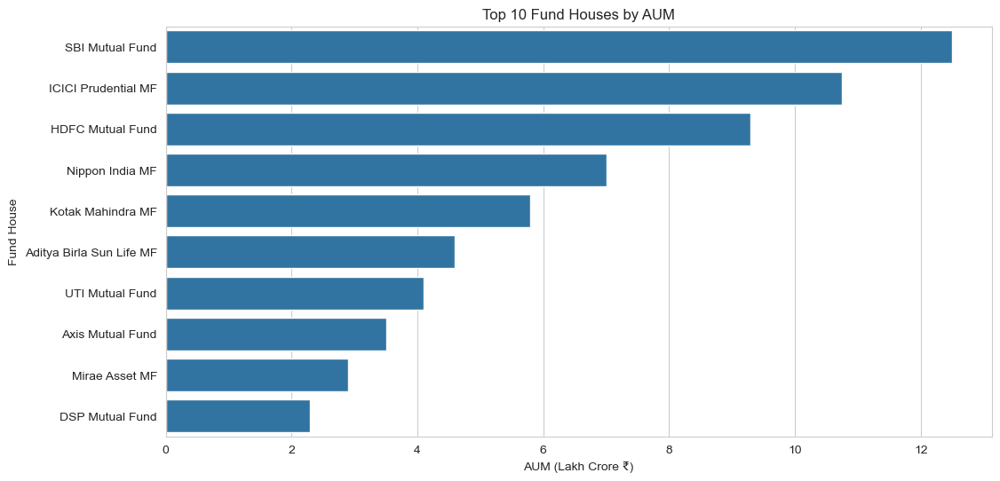

In [7]:
top10 = (
    aum
    .groupby("fund_house")["aum_lakh_crore"]
    .max()
    .sort_values(ascending=False)
    .head(10)
)

plt.figure(figsize=(12,6))

sns.barplot(
    x=top10.values,
    y=top10.index
)

plt.title("Top 10 Fund Houses by AUM")

plt.xlabel("AUM (Lakh Crore ₹)")

plt.ylabel("Fund House")

plt.savefig("../reports/charts/top10_fundhouse_by_aum.png")
plt.show()

### Insight 2: AUM Growth by Fund House

##### - Assets Under Management (AUM) increased steadily across all major fund houses between 2022 and 2025.
##### - SBI Mutual Fund consistently remained the market leader and reached approximately ₹12.5 lakh crore AUM in 2025.
##### - ICICI Prudential and HDFC Mutual Fund also demonstrated strong year-over-year growth, reflecting increasing investor participation.

### Task-3 : Monthly SIP Inflow Trend (2022–2025)

In [8]:
# ==========================================================
# TASK 3 : Monthly SIP Inflow Trend (2022–2025)
# ==========================================================

# Convert month column to datetime
sip["month"] = pd.to_datetime(sip["month"])

# Create Plotly line chart
fig = px.line(
    sip,
    x="month",
    y="sip_inflow_crore",
    markers=True,
    title="Monthly SIP Inflow Trend (Jan 2022 – Dec 2025)",
    labels={
        "month": "Month",
        "sip_inflow_crore": "SIP Inflow (₹ Crore)"
    }
)

# Highlight all-time high
fig.add_annotation(
    x=pd.Timestamp("2025-12-01"),
    y=31002,
    text="<b>₹31,002 Cr</b><br>All-Time High",
    showarrow=True,
    arrowhead=2,
    arrowsize=1,
    arrowwidth=2,
    arrowcolor="red",
    ax=-70,
    ay=-50,
    font=dict(
        size=12,
        color="red"
    )
)

# Improve layout
fig.update_layout(
    template="plotly_white",
    height=600,
    width=1200,
    title_x=0.5,
    hovermode="x unified",
    font=dict(size=13)
)

# Save chart
fig.write_html("../reports/charts/sip_trend.html")

fig.show()

### Insight 3: Monthly SIP Inflow Trend

##### - Monthly SIP inflows showed a consistent upward trend from January 2022 to December 2025.
##### - SIP investments crossed an all-time high of ₹31,002 crore in December 2025, indicating strong retail investor participation.
##### - The steady increase reflects growing confidence in systematic investing through mutual funds.

### Task-4 : Category Inflow Heatmap

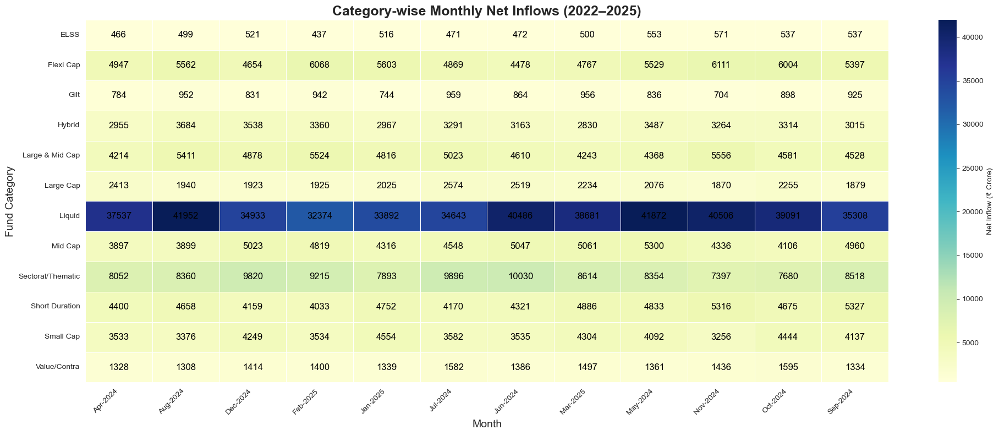

In [9]:
# ==========================================================
# TASK 4 : Category Inflow Heatmap
# ==========================================================

# Convert month column to datetime
category["month"] = pd.to_datetime(category["month"])

# Convert month to Month-Year format
category["month"] = category["month"].dt.strftime("%b-%Y")

# Create pivot table
pivot = category.pivot(
    index="category",
    columns="month",
    values="net_inflow_crore"
)

# Create figure
plt.figure(figsize=(20,8))

# Plot heatmap
sns.heatmap(
    pivot,
    cmap="YlGnBu",
    annot=True,                     # Show values in each cell
    fmt=".0f",                      # Integer values
    linewidths=0.5,
    linecolor="white",
    cbar_kws={
        "label": "Net Inflow (₹ Crore)"
    },
    annot_kws={
        "size":12,
        "color":"black"
    }
)

# Chart Title
plt.title(
    "Category-wise Monthly Net Inflows (2022–2025)",
    fontsize=18,
    fontweight="bold"
)

# Axis Labels
plt.xlabel("Month", fontsize=14)
plt.ylabel("Fund Category", fontsize=14)

# Rotate labels
plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=0)

plt.tight_layout()

# Save chart
plt.savefig("../reports/charts/category_inflows_heatmap.png")

plt.show()

### Insight 4: Category-wise Net Inflow Heatmap

##### - Equity-oriented categories consistently recorded higher net inflows than other categories throughout 2022–2025.
##### - Several categories showed stronger inflows during 2024–2025, indicating increased investor confidence.
##### - The heatmap highlights seasonal and category-wise variations in mutual fund investments over time.

### Task-5 : Investor demographics 

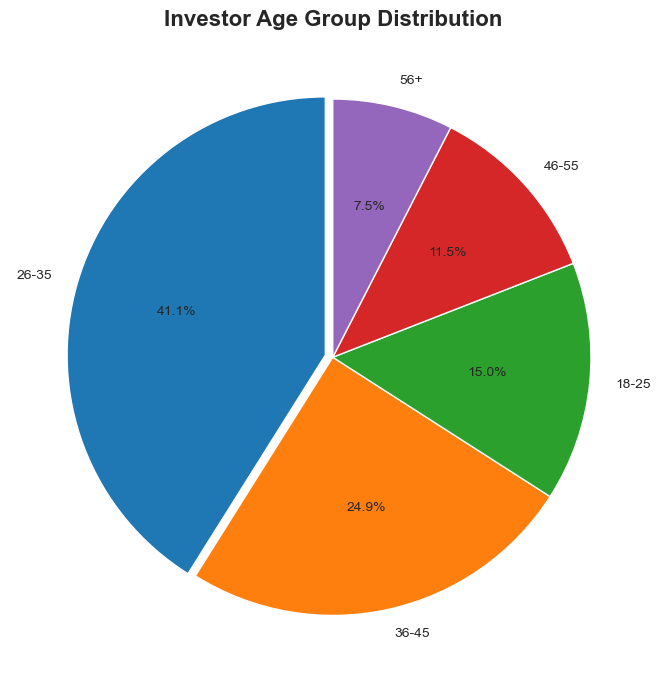

In [10]:
# ==========================================================
# TASK 5 : Investor Demographics - Age Group Distribution
# ==========================================================

plt.figure(figsize=(7,7))

investor["age_group"].value_counts().plot(
    kind="pie",
    autopct="%1.1f%%",
    startangle=90,
    explode=[0.03,0,0,0,0]
)

plt.title(
    "Investor Age Group Distribution",
    fontsize=16,
    fontweight="bold"
)

plt.ylabel("")

plt.tight_layout()

plt.savefig("../reports/charts/age_group_distribution.png")

plt.show()

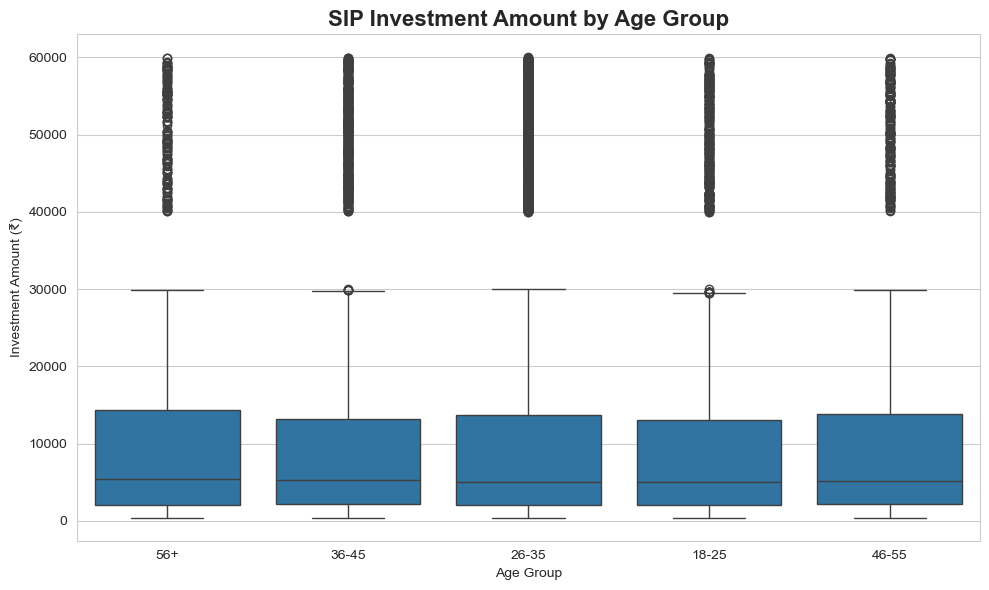

In [11]:
# ==========================================================
# TASK 5 : Investor Demographics - SIP Amount Box Plot
# ==========================================================


sip_txn = investor[
    investor["transaction_type"]=="SIP"
]

plt.figure(figsize=(10,6))

sns.boxplot(
    data=sip_txn,
    x="age_group",
    y="amount_inr"
)

plt.title(
    "SIP Investment Amount by Age Group",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Age Group")
plt.ylabel("Investment Amount (₹)")

plt.tight_layout()

plt.savefig("../reports/charts/sip_amount_boxplot.png")

plt.show()

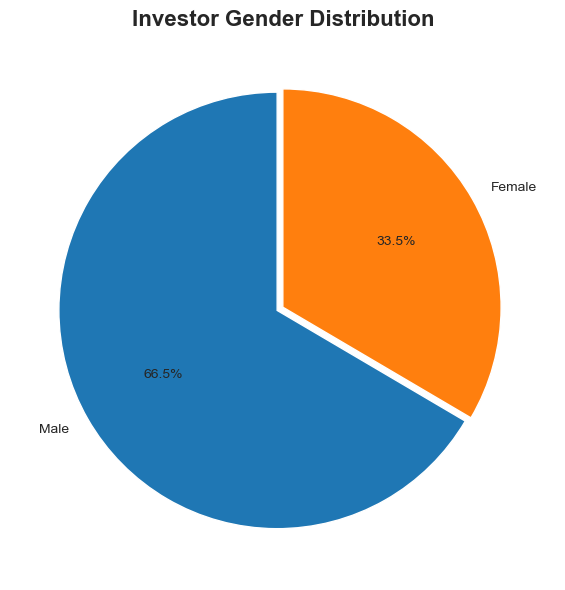

In [12]:
# ==========================================================
# TASK 5 : Investor Demographics - Gender Distribution
# ==========================================================

plt.figure(figsize=(6,6))

investor["gender"].value_counts().plot(
    kind="pie",
    autopct="%1.1f%%",
    startangle=90,
    explode=[0.03,0]
)

plt.title(
    "Investor Gender Distribution",
    fontsize=16,
    fontweight="bold"
)

plt.ylabel("")

plt.tight_layout()

plt.savefig("../reports/charts/gender_distribution.png")

plt.show()

### Insight 5: Investor Demographics

##### - Investors aged **26–35 years** form the largest investor group, accounting for over 40% of all investors.
##### - SIP investment amounts are distributed across all age groups, with similar median investment values and several high-value outliers.
##### - Male investors represent approximately two-thirds of the investor base, indicating higher participation than female investors.

### Task-6 : Geographic distribution

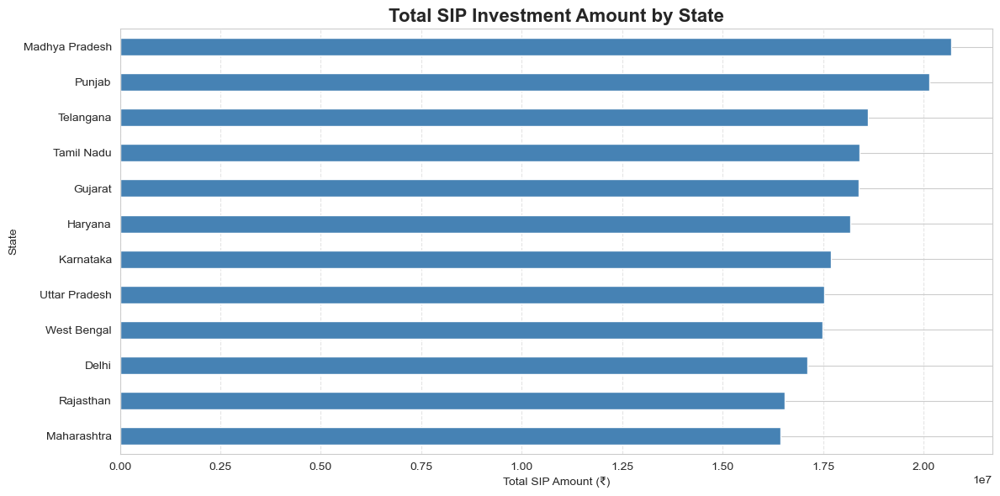

In [13]:
# ==========================================================
# TASK 6 : Geographic Distribution - SIP Amount by State 
# ==========================================================

# Total SIP amount by state
state = (
    sip_txn.groupby("state")["amount_inr"]
    .sum()
    .sort_values()
)

# Plot
plt.figure(figsize=(12,6))

state.plot(
    kind="barh",
    color="steelblue"
)

plt.title(
    "Total SIP Investment Amount by State",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Total SIP Amount (₹)")
plt.ylabel("State")

plt.grid(axis="x", linestyle="--", alpha=0.5)

plt.tight_layout()

plt.savefig("../reports/charts/sip_state_distribution.png")

plt.show()

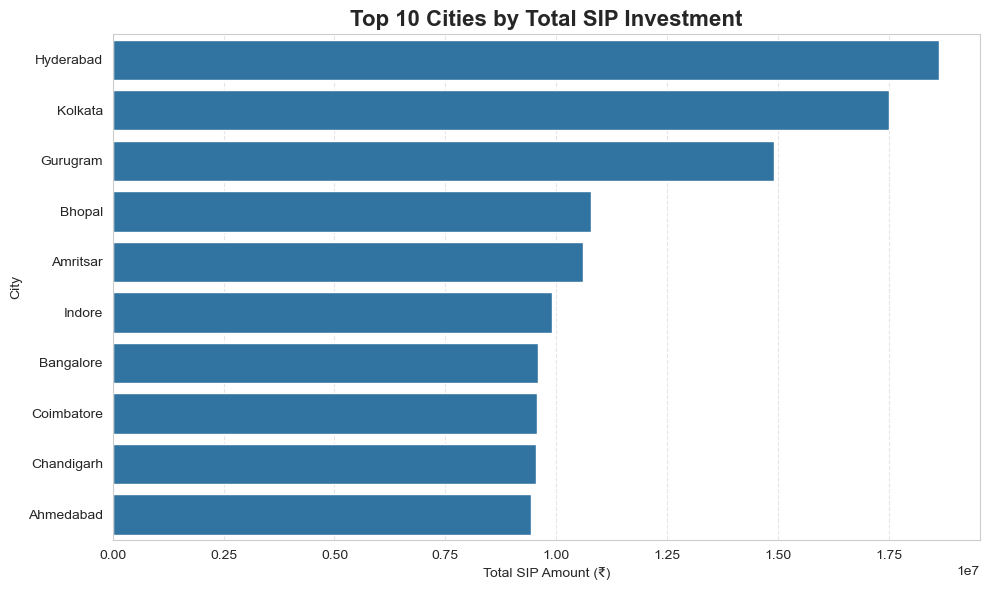

In [14]:
# ==========================================================
# Top 10 Cities by SIP Amount
# ==========================================================

top10_city = (
    sip_txn.groupby("city")["amount_inr"]
    .sum()
    .sort_values(ascending=False)
    .head(10)
)

plt.figure(figsize=(10,6))

sns.barplot(
    x=top10_city.values,
    y=top10_city.index,
    orient="h"
)

plt.title(
    "Top 10 Cities by Total SIP Investment",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Total SIP Amount (₹)")
plt.ylabel("City")

plt.grid(axis="x", linestyle="--", alpha=0.5)

plt.tight_layout()

plt.savefig("../reports/charts/top10_city_sip_investment.png")

plt.show()

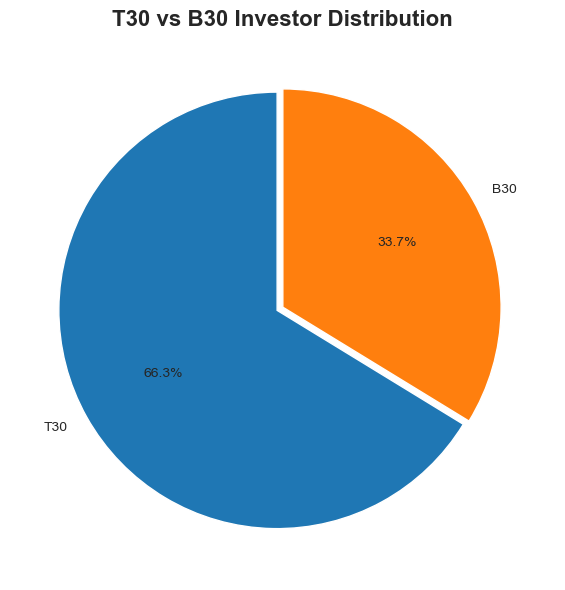

In [15]:
# ==========================================================
# TASK 6 : Geographic Distribution - T30 vs B30 City Tier 
# ==========================================================

plt.figure(figsize=(6,6))

investor["city_tier"].value_counts().plot(
    kind="pie",
    autopct="%1.1f%%",
    startangle=90,
    explode=[0.03,0]
)

plt.title(
    "T30 vs B30 Investor Distribution",
    fontsize=16,
    fontweight="bold"
)

plt.ylabel("")

plt.tight_layout()

plt.savefig("../reports/charts/t30_b30_distribution.png")

plt.show()

### Insight 6: Geographic Distribution

##### - SIP investments are well distributed across major Indian states, with Madhya Pradesh and Punjab recording the highest cumulative SIP investment amounts in this dataset.
##### - T30 cities account for approximately two-thirds of investors, while B30 cities contribute about one-third, indicating stronger participation from larger urban markets.

### Task-7 : Folio count growth

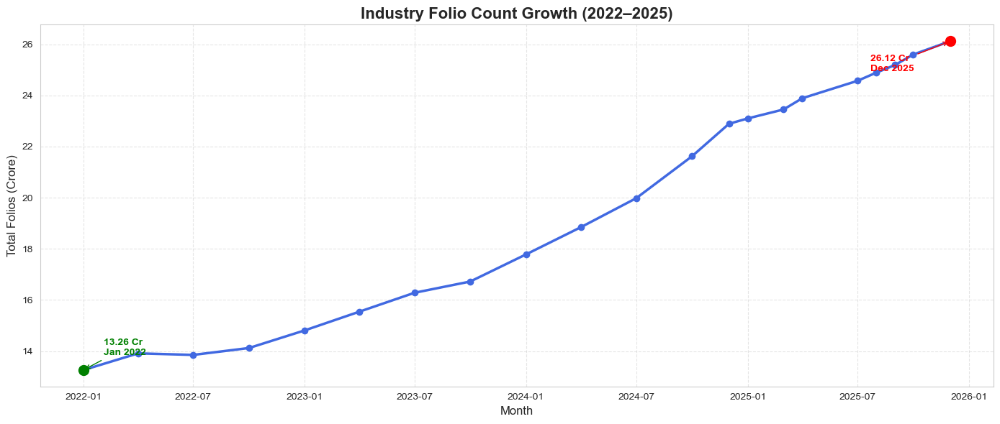

In [16]:
# ==========================================================
# TASK 7 : Industry Folio Count Growth
# ==========================================================

# Convert month column to datetime
folio["month"] = pd.to_datetime(folio["month"])

# Create figure
plt.figure(figsize=(14,6))

plt.plot(
    folio["month"],
    folio["total_folios_crore"],
    marker="o",
    linewidth=2.5,
    markersize=6,
    color="royalblue"
)

# Highlight Starting Point (Jan 2022)
plt.scatter(
    folio.iloc[0]["month"],
    folio.iloc[0]["total_folios_crore"],
    color="green",
    s=100,
    zorder=5
)

plt.annotate(
    "13.26 Cr\nJan 2022",
    xy=(
        folio.iloc[0]["month"],
        folio.iloc[0]["total_folios_crore"]
    ),
    xytext=(20,15),
    textcoords="offset points",
    fontsize=10,
    color="green",
    fontweight="bold",
    arrowprops=dict(
        arrowstyle="->",
        color="green"
    )
)

# Highlight Ending Point (Dec 2025)
plt.scatter(
    folio.iloc[-1]["month"],
    folio.iloc[-1]["total_folios_crore"],
    color="red",
    s=100,
    zorder=5
)

plt.annotate(
    "26.12 Cr\nDec 2025",
    xy=(
        folio.iloc[-1]["month"],
        folio.iloc[-1]["total_folios_crore"]
    ),
    xytext=(-80,-30),
    textcoords="offset points",
    fontsize=10,
    color="red",
    fontweight="bold",
    arrowprops=dict(
        arrowstyle="->",
        color="red"
    )
)

# Titles
plt.title(
    "Industry Folio Count Growth (2022–2025)",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Month", fontsize=12)
plt.ylabel("Total Folios (Crore)", fontsize=12)

plt.grid(True, linestyle="--", alpha=0.5)

plt.tight_layout()

# Save chart
plt.savefig("../reports/charts/folio_growth.png")

plt.show()

### Insight 7: Industry Folio Count Growth

##### - Industry folio count increased steadily from **13.26 crore in January 2022** to **26.12 crore in December 2025**.
##### - The number of folios almost doubled over four years, reflecting strong growth in mutual fund participation.
##### - The sharpest increase was observed during 2024–2025, indicating accelerating investor adoption.

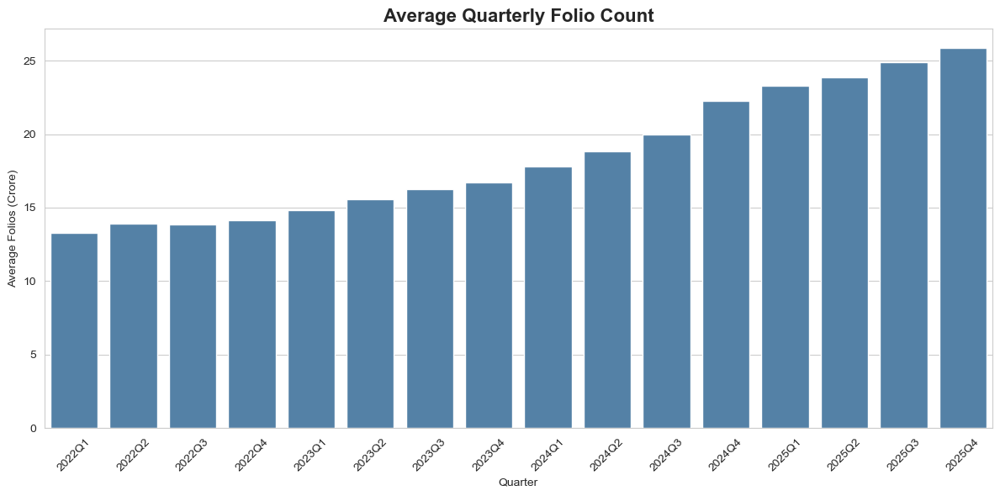

In [17]:
# ==========================================================
#  1 : Quarterly Folio Growth
# ==========================================================

folio["quarter"] = folio["month"].dt.to_period("Q").astype(str)

quarterly = (
    folio.groupby("quarter")["total_folios_crore"]
    .mean()
    .reset_index()
)

plt.figure(figsize=(12,6))

sns.barplot(
    data=quarterly,
    x="quarter",
    y="total_folios_crore",
    color="steelblue"
)

plt.title(
    "Average Quarterly Folio Count",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Quarter")
plt.ylabel("Average Folios (Crore)")

plt.xticks(rotation=45)

plt.tight_layout()

plt.savefig("../reports/charts/quarterly_folio_growth.png")

plt.show()

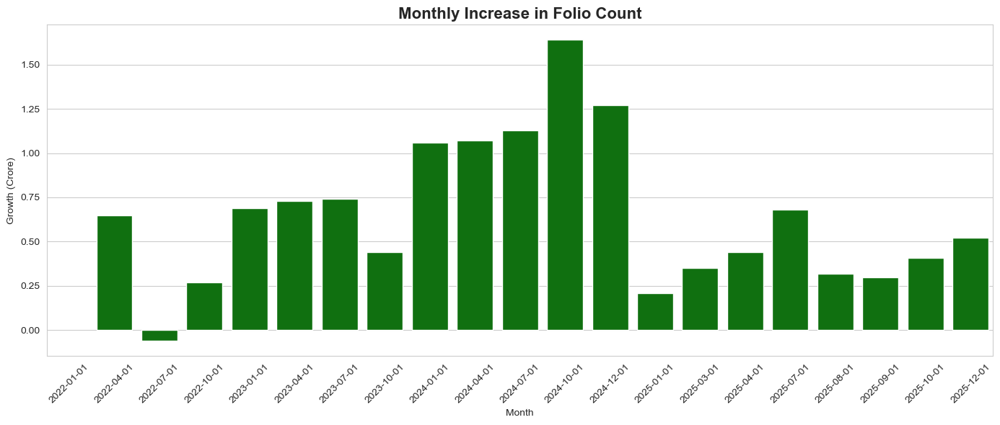

In [18]:
# ==========================================================
# 2 : Monthly Folio Growth
# ==========================================================

folio["monthly_growth"] = folio["total_folios_crore"].diff()

plt.figure(figsize=(14,6))

sns.barplot(
    data=folio,
    x="month",
    y="monthly_growth",
    color="green"
)

plt.title(
    "Monthly Increase in Folio Count",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Month")
plt.ylabel("Growth (Crore)")

plt.xticks(rotation=45)

plt.tight_layout()

plt.savefig("../reports/charts/monthly_folio_growth.png")

plt.show()

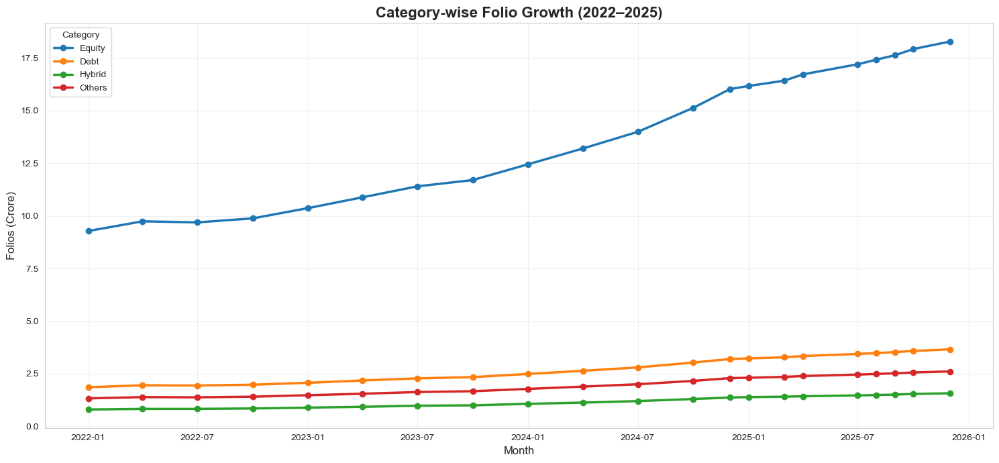

In [19]:
# ==========================================================
# 3 : Category-wise Folio Growth (2022–2025)
# ==========================================================

# Convert month to datetime
folio["month"] = pd.to_datetime(folio["month"])

plt.figure(figsize=(15,7))

plt.plot(
    folio["month"],
    folio["equity_folios_crore"],
    marker="o",
    linewidth=2.5,
    label="Equity"
)

plt.plot(
    folio["month"],
    folio["debt_folios_crore"],
    marker="o",
    linewidth=2.5,
    label="Debt"
)

plt.plot(
    folio["month"],
    folio["hybrid_folios_crore"],
    marker="o",
    linewidth=2.5,
    label="Hybrid"
)

plt.plot(
    folio["month"],
    folio["others_folios_crore"],
    marker="o",
    linewidth=2.5,
    label="Others"
)

plt.title(
    "Category-wise Folio Growth (2022–2025)",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Month", fontsize=12)
plt.ylabel("Folios (Crore)", fontsize=12)

plt.grid(alpha=0.3)
plt.legend(title="Category")

plt.tight_layout()

plt.savefig("../reports/charts/category_folio_growth.png")

plt.show()

### Task-8 : NAV return correlation matrix

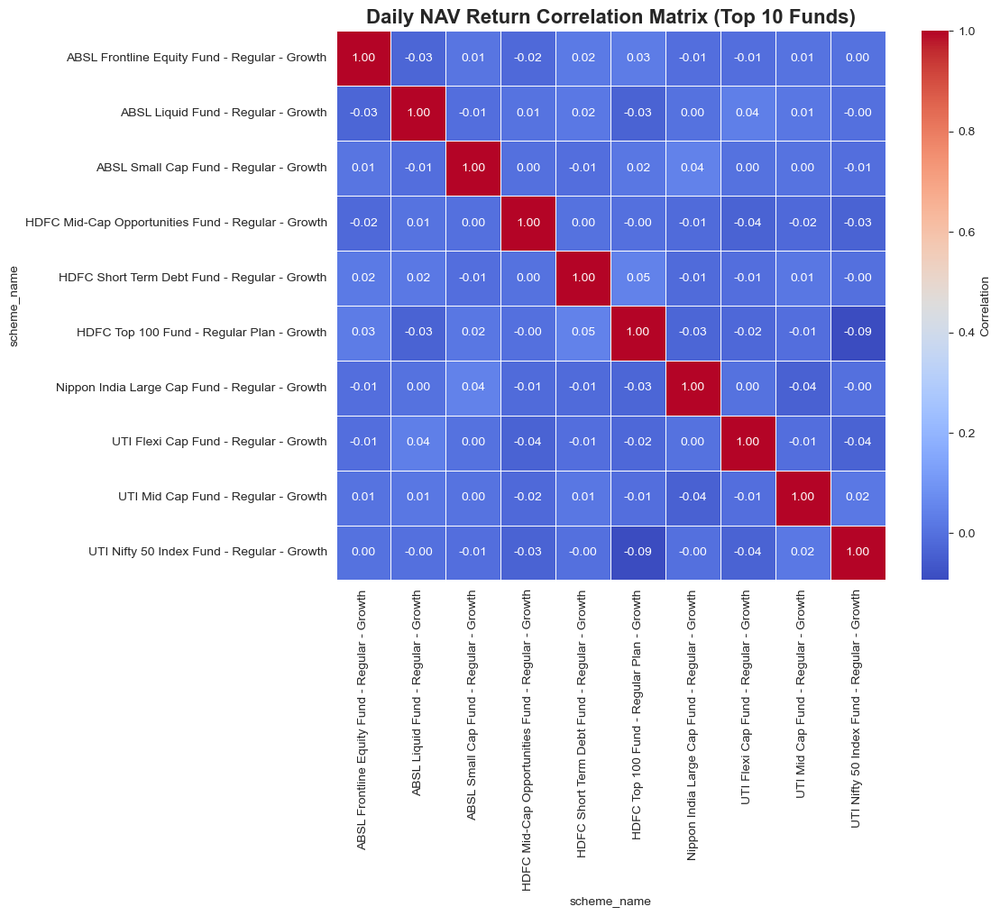

In [20]:
# ==========================================================
# TASK 8 : NAV Return Correlation Matrix
# ==========================================================

# Merge NAV data with fund names
nav_corr = nav.merge(
    fund_master[["amfi_code", "scheme_name"]],
    on="amfi_code",
    how="left"
)

# Select first 10 funds
top10 = nav_corr["scheme_name"].unique()[:10]

# Create pivot table
pivot = (
    nav_corr[
        nav_corr["scheme_name"].isin(top10)
    ]
    .pivot(
        index="date",
        columns="scheme_name",
        values="nav"
    )
)

# Calculate daily returns
returns = pivot.pct_change()

# Correlation matrix
corr = returns.corr()

# Plot
plt.figure(figsize=(12,10))

sns.heatmap(
    corr,
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    square=True,
    linewidths=0.5,
    linecolor="white",
    cbar_kws={
        "label":"Correlation"
    }
)

plt.title(
    "Daily NAV Return Correlation Matrix (Top 10 Funds)",
    fontsize=16,
    fontweight="bold"
)

plt.xticks(rotation=90)
plt.yticks(rotation=0)

plt.tight_layout()

plt.savefig("../reports/charts/nav_return_correlation.png")

plt.show()

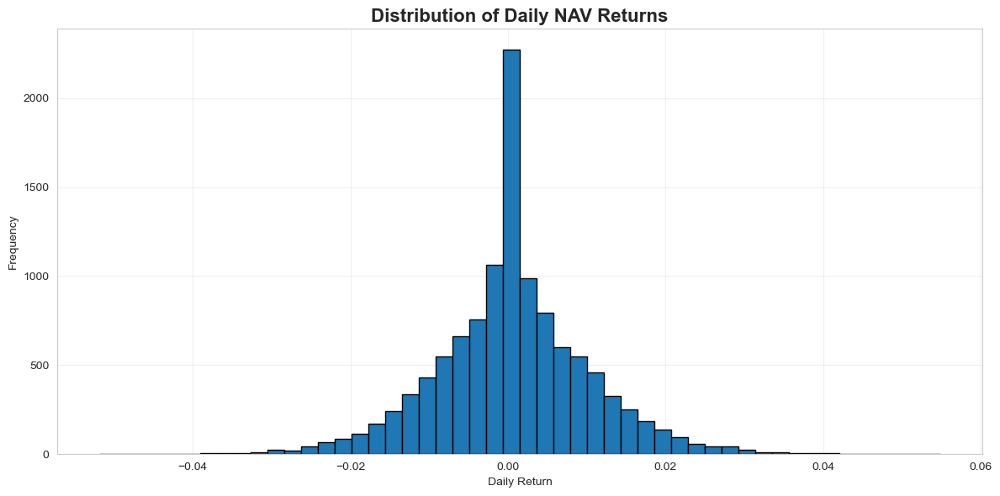

In [21]:
# ==========================================================
# Daily Return Distribution
# ==========================================================

plt.figure(figsize=(12,6))

returns.stack().hist(
    bins=50,
    edgecolor="black"
)

plt.title(
    "Distribution of Daily NAV Returns",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Daily Return")
plt.ylabel("Frequency")

plt.grid(alpha=0.3)

plt.tight_layout()

plt.savefig("../reports/charts/daily_nav_return_distribution.png")

plt.show()

### Insight 8: NAV Return Correlation Matrix

##### - Most selected mutual funds exhibit weak to moderate correlations in daily NAV returns.
##### - Equity-oriented funds generally show higher positive correlations than debt-oriented funds.
##### - Low correlations indicate diversification benefits when combining different fund categories in a portfolio.

### Task-9 : Sector allocation donut

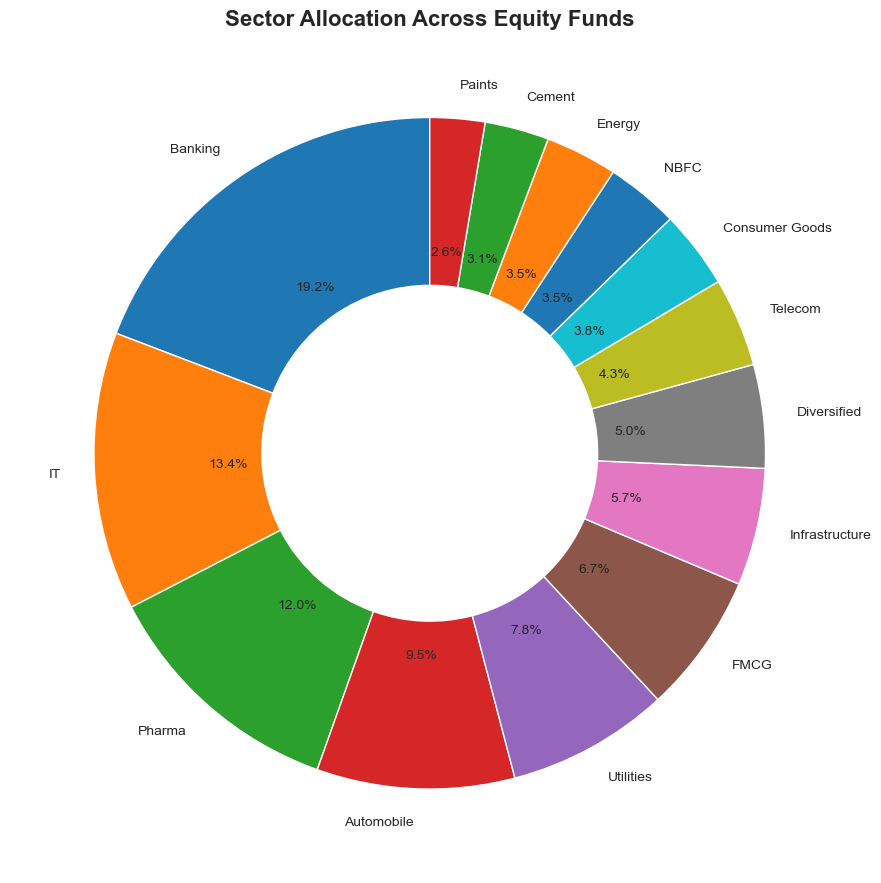

In [22]:
# ==========================================================
# TASK 9 : Sector Allocation Donut Chart
# ==========================================================

# Aggregate sector weights
sector = (
    portfolio.groupby("sector")["weight_pct"]
    .sum()
    .sort_values(ascending=False)
)

plt.figure(figsize=(9,9))

plt.pie(
    sector,
    labels=sector.index,
    autopct="%1.1f%%",
    startangle=90,
    wedgeprops=dict(width=0.5, edgecolor="white")
)

plt.title(
    "Sector Allocation Across Equity Funds",
    fontsize=16,
    fontweight="bold"
)

plt.tight_layout()

plt.savefig("../reports/charts/sector_allocation.png")

plt.show()

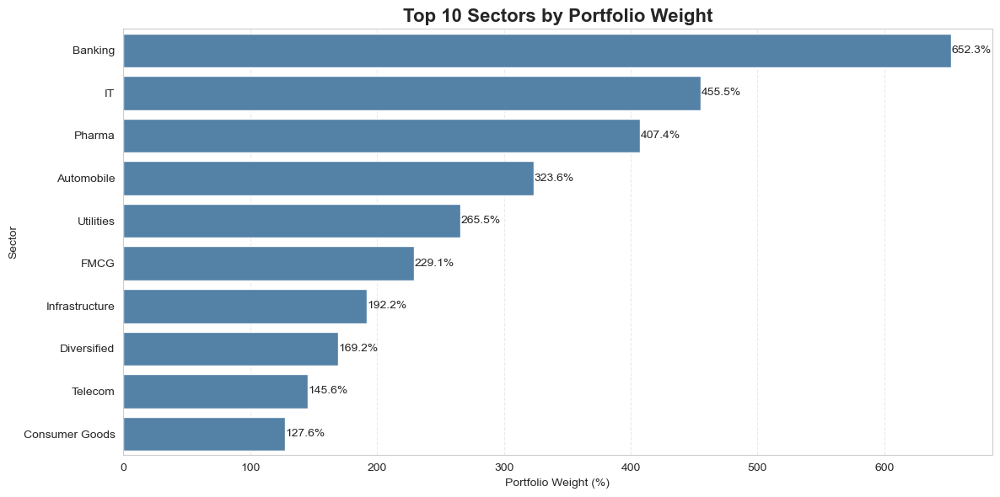

In [23]:
# ==========================================================
# Top 10 Sectors by Portfolio Weight
# ==========================================================

top10_sector = (
    portfolio.groupby("sector")["weight_pct"]
    .sum()
    .sort_values(ascending=False)
    .head(10)
)

plt.figure(figsize=(12,6))

ax = sns.barplot(
    x=top10_sector.values,
    y=top10_sector.index,
    color="steelblue"
)

# Add value labels
for i, value in enumerate(top10_sector.values):
    ax.text(
        value + 0.3,
        i,
        f"{value:.1f}%",
        va="center",
        fontsize=10
    )

plt.title(
    "Top 10 Sectors by Portfolio Weight",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Portfolio Weight (%)")
plt.ylabel("Sector")

plt.grid(axis="x", linestyle="--", alpha=0.4)

plt.tight_layout()

plt.savefig("../reports/charts/top10_sector_weight.png")

plt.show()

### Insight 9: Sector Allocation

##### - Banking is the largest sector allocation across equity mutual funds, accounting for approximately 19% of the portfolio.
##### - IT and Pharma also contribute significant portfolio weights, reflecting strong exposure to growth-oriented sectors.
##### - The Top 10 sectors together account for the majority of the overall portfolio allocation, indicating sector concentration in diversified equity funds.

## 5. Findings

#### Finding 1: Consistent Growth in NAV

**Insight:** Most mutual fund schemes exhibited a steady increase in Net Asset Value (NAV) between 2022 and 2025. A strong upward trend was observed during the 2023 bull market, followed by a temporary slowdown during the 2024 market correction before recovering in 2025.

**Chart Reference:** Figure 1 – Daily NAV Trend (2022–2026)

#### Finding 2: SBI Mutual Fund Leads Industry AUM

**Insight:** Assets Under Management (AUM) increased across all major fund houses during the study period. SBI Mutual Fund remained the market leader, reaching approximately ₹12.5 lakh crore AUM by 2025.

**Chart Reference:** Figures 2, 3 & 4 – Fund House AUM Growth and Top 10 Fund Houses by AUM

#### Finding 3: Record Growth in Monthly SIP Inflows

**Insight:** Monthly SIP inflows showed continuous year-on-year growth and reached an all-time high of ₹31,002 crore in December 2025, indicating increasing investor confidence and systematic investing.

**Chart Reference:** Figure 5 – Monthly SIP Inflow Trend

#### Finding 4: Liquid and Equity Categories Attracted Higher Investments

**Insight:** The category-wise heatmap shows that Liquid Funds consistently recorded the highest monthly net inflows, while Flexi Cap, Sectoral/Thematic, and Large & Mid Cap funds also attracted strong investor interest.

**Chart Reference:** Figure 6 – Category-wise Monthly Net Inflows Heatmap

#### Finding 5: Young Investors Dominate the Market

**Insight:** Investors aged 26–35 formed the largest investor segment (around 41%), and male investors accounted for nearly two-thirds of the total investor base.

**Chart Reference:** Figures 7,8 & 9 – Investor Age Distribution and Gender Distribution

#### Finding 6: SIP Investments Concentrated in Major Cities and T30 Locations

**Insight:** Hyderabad, Kolkata, and Gurugram recorded the highest SIP investment amounts among cities. Around 66% of investors belonged to T30 cities, indicating greater participation from metropolitan regions.

**Chart Reference:** Figures 10, 11 & 12 – State Distribution, Top 10 Cities by SIP Investment and T30 vs B30 Distribution

#### Finding 7: Rapid Increase in Industry Folio Count

**Insight:** Total industry folios nearly doubled from 13.26 crore in January 2022 to 26.12 crore in December 2025. Equity folios experienced the highest growth compared to Debt, Hybrid, and Other categories.

**Chart Reference:** Figures 13, 14, 15 & 16 – Industry Folio Growth, Monthly Folio Growth, Quarterly Folio Growth and Category-wise Folio Growth

#### Finding 8: Banking and IT Dominated Portfolio Allocation

**Insight:** Banking accounted for the highest portfolio allocation, followed by IT, Pharma, and Automobile sectors, indicating strong exposure toward India's major economic sectors.

**Chart Reference:** Figures 17 & 18 – Sector Allocation Donut Chart and Top 10 Sectors by Portfolio Weight

#### Finding 9: Daily NAV Returns Show Low Correlation Across Funds

**Insight:** The correlation matrix indicates weak to moderate correlations among the selected mutual funds, suggesting good diversification opportunities. The daily return distribution is centered around zero, reflecting generally stable day-to-day movements.

**Chart Reference:** Figures 19 & 20 – NAV Return Correlation Matrix and Daily NAV Return Distribution

#### Finding 10: Strong Overall Growth of the Mutual Fund Industry

**Insight:** The combined analysis of NAV trends, AUM growth, SIP inflows, folio growth, and investor participation indicates that the Indian mutual fund industry experienced sustained expansion between 2022 and 2025, driven by increasing retail participation and long-term investment behavior.

**Chart Reference:** Overall EDA Dashboard (Figures 1–20)